In [259]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as mp
import seaborn as sb

In [260]:
Train = pd.read_excel('Train\Z_DataTrain_All_Clean.xlsx')
Namecolonnes = Train.columns
for i in Namecolonnes:
    print(i)

ID
LegiT22022_Plus_vote
LegiT12022_Plus_vote
Euro2019_Inscrits
Euro2019_Votants
Euro2019_Abstentions
Euro2019_Blancs
Euro2019_Nuls
Euro2019_Exprimés
Euro2019_% Abs/Ins
Euro2019_% Vot/Ins
Euro2019_% Blancs/Ins
Euro2019_% Blancs/Vot
Euro2019_% Nuls/Ins
Euro2019_% Nuls/Vot
Euro2019_% Exp/Ins
Euro2019_% Exp/Vot
Euro2019_Voix_1
Euro2019_Voix_2
Euro2019_Voix_3
Euro2019_Voix_4
Euro2019_Plus_vote
Euro2019_Moins_vote
Euro2019_Voix_1/Inscrits
Euro2019_Voix_2/Inscrits
Euro2019_Voix_3/Inscrits
Euro2019_Voix_4/Inscrits
Euro2019_Voix/Inscrits_ecarttype
Euro2019_Voix/Inscrits_skewness
Euro2019_Voix/Inscrits_kurtosis
LegiT12017_Inscrits
LegiT12017_Abstentions
LegiT12017_% Abs/Ins
LegiT12017_Votants
LegiT12017_% Vot/Ins
LegiT12017_Blancs
LegiT12017_% Blancs/Ins
LegiT12017_% Blancs/Vot
LegiT12017_Nuls
LegiT12017_% Nuls/Ins
LegiT12017_% Nuls/Vot
LegiT12017_Exprimés
LegiT12017_% Exp/Ins
LegiT12017_% Exp/Vot
LegiT12017_Voix_1
LegiT12017_Voix_2
LegiT12017_Voix_3
LegiT12017_Voix_4
LegiT12017_Plus_vote
LegiT1

In [261]:
Y_Train = Train[["LegiT22022_Plus_vote","LegiT12022_Plus_vote"]]
X_Train = Train.drop(["ID","LegiT22022_Plus_vote","LegiT12022_Plus_vote"],axis=1)

In [262]:
X_Train

,Euro2019_Inscrits,Euro2019_Votants,Euro2019_Abstentions,Euro2019_Blancs,Euro2019_Nuls,Euro2019_Exprimés,Euro2019_% Abs/Ins,Euro2019_% Vot/Ins,Euro2019_% Blancs/Ins,Euro2019_% Blancs/Vot,...,PresT22017_Voix_4,PresT22017_Plus_vote,PresT22017_Moins_vote,PresT22017_Voix_1/Inscrits,PresT22017_Voix_2/Inscrits,PresT22017_Voix_3/Inscrits,PresT22017_Voix_4/Inscrits,PresT22017_Voix/Inscrits_ecarttype,PresT22017_Voix/Inscrits_skewness,PresT22017_Voix/Inscrits_kurtosis
0,81883,41260,40623,1052,994,39214,49.61,50.39,1.28,2.55,...,22644,2,4,0,0.414170,0,0.273968,0.179033,0.220981,-3.832506
1,93997,48327,45670,945,680,46702,48.59,51.41,1.01,1.96,...,26144,2,4,0,0.419723,0,0.280022,0.181775,0.213159,-3.907727
2,77731,36842,40889,654,644,35544,52.60,47.40,0.84,1.78,...,15573,2,4,0,0.474182,0,0.206448,0.194715,0.619576,-0.166751
3,89666,44896,44770,1081,977,42838,49.93,50.07,1.21,2.41,...,26163,2,4,0,0.404628,0,0.293038,0.178823,0.142430,-4.593027
4,74504,36611,37893,942,842,34827,50.86,49.14,1.26,2.57,...,20872,2,4,0,0.379123,0,0.277476,0.168038,0.134042,-4.674898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
568,100773,22786,77987,85,341,22360,77.39,22.61,0.08,0.37,...,3558,2,4,0,0.500033,0,0.033596,0.212115,1.140460,3.912870
569,107178,11116,96062,52,201,10863,89.63,10.37,0.05,0.47,...,3143,2,4,0,0.229063,0,0.025893,0.096033,1.114010,3.741505
570,111969,18031,93938,150,320,17561,83.90,16.10,0.13,0.83,...,3690,2,4,0,0.360356,0,0.034234,0.151742,1.126046,3.820598
571,98827,18352,80475,155,209,17988,81.43,18.57,0.16,0.84,...,8535,2,4,0,0.371218,0,0.085421,0.152455,0.986818,2.836671


In [263]:
Y_Train

,LegiT22022_Plus_vote,LegiT12022_Plus_vote
0,3,1
1,2,2
2,2,2
3,4,2
4,3,3
...,...,...
568,2,2
569,2,2
570,1,2
571,2,2


#### Pour définir le bloc gagnant dans la circonscription, on a deux choix, premièrement suivre le processus de 1er et 2eme tour, et deuixèmement passer directement du premier tour à l'élection du bloc gagnant. Par la suite, on utilisera la seconde méthode

##### On va retirer les données en valeur absolue afin de se concentrer sur les quantités relatives comme le nombre de voix rapporté au nombre d'inscrits, auquel on ajoute le bloc gagnant à chaque tour

In [264]:
#comme on a choisi la seconde option alors on peut supprimer de Y_train la partie sur le gagnant du premier tour
Y_Train = Y_Train.drop('LegiT12022_Plus_vote',axis=1)

In [265]:
VariableAGarder_Name = []
VariableAGarder_Location = []
for i in range(0,len(Namecolonnes)):
    for carac in Namecolonnes[i]:
        cond1 = carac == "/"
        cond2 = False
        if (cond1 or cond2) == True:
            VariableAGarder_Name.append(Namecolonnes[i])
            VariableAGarder_Location.append(i)
            continue
VariableAGarder_Name

['Euro2019_% Abs/Ins',
 'Euro2019_% Vot/Ins',
 'Euro2019_% Blancs/Ins',
 'Euro2019_% Blancs/Vot',
 'Euro2019_% Nuls/Ins',
 'Euro2019_% Nuls/Vot',
 'Euro2019_% Exp/Ins',
 'Euro2019_% Exp/Vot',
 'Euro2019_Voix_1/Inscrits',
 'Euro2019_Voix_2/Inscrits',
 'Euro2019_Voix_3/Inscrits',
 'Euro2019_Voix_4/Inscrits',
 'Euro2019_Voix/Inscrits_ecarttype',
 'Euro2019_Voix/Inscrits_skewness',
 'Euro2019_Voix/Inscrits_kurtosis',
 'LegiT12017_% Abs/Ins',
 'LegiT12017_% Vot/Ins',
 'LegiT12017_% Blancs/Ins',
 'LegiT12017_% Blancs/Vot',
 'LegiT12017_% Nuls/Ins',
 'LegiT12017_% Nuls/Vot',
 'LegiT12017_% Exp/Ins',
 'LegiT12017_% Exp/Vot',
 'LegiT12017_Voix_1/Inscrits',
 'LegiT12017_Voix_2/Inscrits',
 'LegiT12017_Voix_3/Inscrits',
 'LegiT12017_Voix_4/Inscrits',
 'LegiT12017_Voix/Inscrits_ecarttype',
 'LegiT12017_Voix/Inscrits_skewness',
 'LegiT12017_Voix/Inscrits_kurtosis',
 'LegiT22017_% Abs/Ins',
 'LegiT22017_% Vot/Ins',
 'LegiT22017_% Blancs/Ins',
 'LegiT22017_% Blancs/Vot',
 'LegiT22017_% Nuls/Ins',
 'Le

On doit ajouter : 'Euro2019_Plus_vote', 'Euro2019_Moins_vote','LegiT12017_Plus_vote','LegiT12017_Moins_vote','LegiT22017_Plus_vote','LegiT22017_Moins_vote','PresT12017_Plus_vote','PresT12017_Moins_vote'

In [266]:
Plus_Moins_variables = ['Euro2019_Plus_vote', 'Euro2019_Moins_vote','LegiT12017_Plus_vote','LegiT12017_Moins_vote','LegiT22017_Plus_vote','LegiT22017_Moins_vote','PresT12017_Plus_vote','PresT12017_Moins_vote']
for i in Plus_Moins_variables:
    VariableAGarder_Location.append(np.where(Namecolonnes == i)[0][0])
    VariableAGarder_Name.append(i)

In [267]:
for i in range(0,len(VariableAGarder_Name)):
    print(f"variable : {VariableAGarder_Name[i]} | emplacement : {VariableAGarder_Location[i]}")

variable : Euro2019_% Abs/Ins | emplacement : 9
variable : Euro2019_% Vot/Ins | emplacement : 10
variable : Euro2019_% Blancs/Ins | emplacement : 11
variable : Euro2019_% Blancs/Vot | emplacement : 12
variable : Euro2019_% Nuls/Ins | emplacement : 13
variable : Euro2019_% Nuls/Vot | emplacement : 14
variable : Euro2019_% Exp/Ins | emplacement : 15
variable : Euro2019_% Exp/Vot | emplacement : 16
variable : Euro2019_Voix_1/Inscrits | emplacement : 23
variable : Euro2019_Voix_2/Inscrits | emplacement : 24
variable : Euro2019_Voix_3/Inscrits | emplacement : 25
variable : Euro2019_Voix_4/Inscrits | emplacement : 26
variable : Euro2019_Voix/Inscrits_ecarttype | emplacement : 27
variable : Euro2019_Voix/Inscrits_skewness | emplacement : 28
variable : Euro2019_Voix/Inscrits_kurtosis | emplacement : 29
variable : LegiT12017_% Abs/Ins | emplacement : 32
variable : LegiT12017_% Vot/Ins | emplacement : 34
variable : LegiT12017_% Blancs/Ins | emplacement : 36
variable : LegiT12017_% Blancs/Vot | e

In [268]:
print(f"Il nous reste {len(VariableAGarder_Name)} variables pour la suite des travaux")
#On peut notamment chercher à éliminer les variables fortement correlées 
#réaliser une matrice des corrélations et en faire une représentation graphique

Il nous reste 83 variables pour la suite des travaux


In [269]:
X_Train_83  = X_Train[VariableAGarder_Name]
X_Train_83.shape

(573, 83)

In [270]:
Train_83_CorrelMatrix = X_Train_83.corr()

In [271]:
mp.figure(figsize=(110,110), dpi=110)
sb.heatmap(Train_83_CorrelMatrix,annot=True,linewidths=0.001,
           annot_kws={"size": 22},linecolor="red", 
           cbar_kws={"shrink": 0.7,'label':'Heatmap de la correlation'})

<Axes: >

In [272]:
threshold = 0.90
high_corr_pairs = []

for i in range(len(Train_83_CorrelMatrix.columns)):
    for j in range(i + 1, len(Train_83_CorrelMatrix.columns)):
        if abs(Train_83_CorrelMatrix.iloc[i, j]) > threshold:
            high_corr_pairs.append((Train_83_CorrelMatrix.columns[i], Train_83_CorrelMatrix.columns[j]))

for i in high_corr_pairs:
    print(i)

('Euro2019_% Abs/Ins', 'Euro2019_% Vot/Ins')
('Euro2019_% Abs/Ins', 'Euro2019_% Exp/Ins')
('Euro2019_% Abs/Ins', 'LegiT12017_% Abs/Ins')
('Euro2019_% Abs/Ins', 'LegiT12017_% Vot/Ins')
('Euro2019_% Abs/Ins', 'LegiT12017_% Exp/Ins')
('Euro2019_% Abs/Ins', 'PresT12017_% Abs/Ins')
('Euro2019_% Abs/Ins', 'PresT12017_% Vot/Ins')
('Euro2019_% Abs/Ins', 'PresT12017_% Exp/Ins')
('Euro2019_% Abs/Ins', 'PresT22017_% Abs/Ins')
('Euro2019_% Abs/Ins', 'PresT22017_% Vot/Ins')
('Euro2019_% Abs/Ins', 'PresT22017_% Exp/Ins')
('Euro2019_% Vot/Ins', 'Euro2019_% Exp/Ins')
('Euro2019_% Vot/Ins', 'LegiT12017_% Abs/Ins')
('Euro2019_% Vot/Ins', 'LegiT12017_% Vot/Ins')
('Euro2019_% Vot/Ins', 'LegiT12017_% Exp/Ins')
('Euro2019_% Vot/Ins', 'PresT12017_% Abs/Ins')
('Euro2019_% Vot/Ins', 'PresT12017_% Vot/Ins')
('Euro2019_% Vot/Ins', 'PresT12017_% Exp/Ins')
('Euro2019_% Vot/Ins', 'PresT22017_% Abs/Ins')
('Euro2019_% Vot/Ins', 'PresT22017_% Vot/Ins')
('Euro2019_% Vot/Ins', 'PresT22017_% Exp/Ins')
('Euro2019_% Blancs

On va supprimer les variables suivantes : 'Euro2019_% Abs/Ins','Euro2019_% Vot/Ins','Euro2019_% Exp/Ins','PresT12017_% Abs/Ins'

In [273]:
VariablesASupprimer = ['Euro2019_% Abs/Ins','Euro2019_% Vot/Ins','Euro2019_% Exp/Ins','PresT12017_% Abs/Ins']

In [274]:
X_Train_79  = X_Train_83.drop(VariablesASupprimer,axis=1)
X_Train_79

,Euro2019_% Blancs/Ins,Euro2019_% Blancs/Vot,Euro2019_% Nuls/Ins,Euro2019_% Nuls/Vot,Euro2019_% Exp/Vot,Euro2019_Voix_1/Inscrits,Euro2019_Voix_2/Inscrits,Euro2019_Voix_3/Inscrits,Euro2019_Voix_4/Inscrits,Euro2019_Voix/Inscrits_ecarttype,...,PresT22017_Voix/Inscrits_skewness,PresT22017_Voix/Inscrits_kurtosis,Euro2019_Plus_vote,Euro2019_Moins_vote,LegiT12017_Plus_vote,LegiT12017_Moins_vote,LegiT22017_Plus_vote,LegiT22017_Moins_vote,PresT12017_Plus_vote,PresT12017_Moins_vote
0,1.28,2.55,1.21,2.41,95.04,0.142960,0.131028,0.074558,0.130357,0.026555,...,0.220981,-3.832506,1,3,3,4,3,2,4,2
1,1.01,1.96,0.72,1.41,96.64,0.152133,0.139015,0.073534,0.132164,0.030125,...,0.213159,-3.907727,1,3,3,4,3,2,4,1
2,0.84,1.78,0.83,1.75,96.48,0.154687,0.145579,0.060954,0.096049,0.038041,...,0.619576,-0.166751,1,3,2,4,2,3,3,4
3,1.21,2.41,1.09,2.18,95.42,0.130819,0.133908,0.076975,0.136049,0.024587,...,0.142430,-4.593027,4,3,2,4,2,3,4,1
4,1.26,2.57,1.13,2.30,95.13,0.141375,0.111685,0.073567,0.140825,0.027733,...,0.134042,-4.674898,1,3,3,4,3,2,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
568,0.08,0.37,0.34,1.50,98.13,0.092247,0.100017,0.016205,0.013416,0.040765,...,1.140460,3.912870,2,4,2,4,2,1,2,4
569,0.05,0.47,0.19,1.81,97.72,0.032040,0.038375,0.020685,0.010254,0.010771,...,1.114010,3.741505,2,4,2,3,2,2,3,4
570,0.13,0.83,0.29,1.77,97.39,0.060445,0.065277,0.014165,0.016951,0.023734,...,1.126046,3.820598,2,3,3,2,4,3,2,4
571,0.16,0.84,0.21,1.14,98.02,0.052476,0.076346,0.027553,0.025641,0.020716,...,0.986818,2.836671,2,4,2,4,2,3,3,4


On a 79 variables, on peut centrer et reduire l'ensemble des variables hors Scrutin_Plus_Voix et Scruting_Moin_Voix

In [275]:
X_Train_79_NameVariable = X_Train_79.columns
X_Train_79_NameVariable

Index(['Euro2019_% Blancs/Ins', 'Euro2019_% Blancs/Vot', 'Euro2019_% Nuls/Ins',
       'Euro2019_% Nuls/Vot', 'Euro2019_% Exp/Vot', 'Euro2019_Voix_1/Inscrits',
       'Euro2019_Voix_2/Inscrits', 'Euro2019_Voix_3/Inscrits',
       'Euro2019_Voix_4/Inscrits', 'Euro2019_Voix/Inscrits_ecarttype',
       'Euro2019_Voix/Inscrits_skewness', 'Euro2019_Voix/Inscrits_kurtosis',
       'LegiT12017_% Abs/Ins', 'LegiT12017_% Vot/Ins',
       'LegiT12017_% Blancs/Ins', 'LegiT12017_% Blancs/Vot',
       'LegiT12017_% Nuls/Ins', 'LegiT12017_% Nuls/Vot',
       'LegiT12017_% Exp/Ins', 'LegiT12017_% Exp/Vot',
       'LegiT12017_Voix_1/Inscrits', 'LegiT12017_Voix_2/Inscrits',
       'LegiT12017_Voix_3/Inscrits', 'LegiT12017_Voix_4/Inscrits',
       'LegiT12017_Voix/Inscrits_ecarttype',
       'LegiT12017_Voix/Inscrits_skewness',
       'LegiT12017_Voix/Inscrits_kurtosis', 'LegiT22017_% Abs/Ins',
       'LegiT22017_% Vot/Ins', 'LegiT22017_% Blancs/Ins',
       'LegiT22017_% Blancs/Vot', 'LegiT22017_% Nuls

Les variables à ne pas centrer et réduire : 
['Euro2019_Plus_vote',
 'Euro2019_Moins_vote',
 'LegiT12017_Plus_vote',
 'LegiT12017_Moins_vote',
 'LegiT22017_Plus_vote',
 'LegiT22017_Moins_vote',
 'PresT12017_Plus_vote',
 'PresT12017_Moins_vote']

In [276]:
X_Train_79_Normaliser = X_Train_79.drop(Plus_Moins_variables,axis=1)
X_Train_79_NameVariable_SansPlusMoins = X_Train_79_Normaliser.columns

In [277]:
from sklearn.preprocessing import StandardScaler
CentrerReduire = StandardScaler()
CentrerReduire.fit(X_Train_79_Normaliser)
X_Train_79_Normaliser = CentrerReduire.transform(X_Train_79_Normaliser)
X_Train_79_Normaliser = pd.DataFrame(X_Train_79_Normaliser, columns=X_Train_79_NameVariable_SansPlusMoins)
X_Train_79_ReadyForTrain = X_Train_79_Normaliser.join(X_Train_79[Plus_Moins_variables])
X_Train_79_ReadyForTrain_Noname = np.array(X_Train_79_ReadyForTrain)
X_Train_79_ReadyForTrain_Noname

array([[ 0.25704162,  0.18015559,  0.21475052, ...,  2.        ,
         4.        ,  2.        ],
       [-0.34294192, -0.41386762, -0.67904587, ...,  2.        ,
         4.        ,  1.        ],
       [-0.72070933, -0.59509503, -0.4783977 , ...,  3.        ,
         3.        ,  4.        ],
       ...,
       [-2.29844383, -1.55157307, -1.4633978 , ...,  3.        ,
         2.        ,  4.        ],
       [-2.23177899, -1.54150488, -1.60932374, ...,  3.        ,
         3.        ,  4.        ],
       [-2.32066544, -1.91402791, -1.42691631, ...,  3.        ,
         2.        ,  4.        ]])

In [278]:
Y_Train_ReadyForTrain_Noname = np.ravel(Y_Train)
Y_Train_ReadyForTrain_Noname

array([3, 2, 2, 4, 3, 4, 3, 1, 4, 4, 1, 4, 3, 4, 1, 2, 2, 3, 4, 2, 4, 3,
       4, 3, 3, 3, 1, 2, 3, 2, 3, 3, 1, 1, 4, 3, 4, 4, 4, 4, 2, 1, 2, 2,
       2, 4, 1, 1, 2, 1, 2, 4, 4, 2, 4, 1, 2, 4, 4, 2, 1, 2, 2, 2, 2, 3,
       3, 2, 2, 4, 1, 2, 2, 2, 2, 2, 1, 2, 3, 3, 2, 3, 3, 3, 2, 2, 2, 3,
       2, 2, 2, 3, 1, 2, 1, 1, 4, 2, 1, 2, 2, 2, 4, 3, 2, 4, 1, 3, 4, 4,
       4, 1, 4, 2, 3, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 4, 4, 4, 4, 1, 2, 1,
       1, 2, 1, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 4, 2, 2, 2, 2, 2, 4,
       2, 2, 1, 2, 1, 4, 3, 4, 1, 2, 1, 2, 1, 1, 2, 2, 3, 1, 2, 3, 1, 2,
       2, 2, 2, 2, 1, 1, 1, 1, 4, 3, 2, 2, 2, 2, 3, 3, 2, 2, 1, 2, 4, 2,
       2, 1, 2, 3, 3, 3, 3, 3, 2, 1, 1, 1, 2, 1, 2, 1, 2, 2, 2, 2, 4, 4,
       2, 2, 3, 1, 2, 4, 4, 2, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 1, 2, 4, 2,
       2, 3, 4, 4, 1, 2, 2, 2, 2, 1, 3, 1, 1, 3, 4, 2, 2, 2, 2, 2, 2, 2,
       1, 3, 3, 4, 4, 4, 2, 2, 2, 1, 1, 1, 2, 4, 2, 2, 1, 2, 2, 1, 4, 2,
       2, 4, 4, 4, 2, 4, 1, 3, 3, 4, 4, 2, 3, 4, 3,

In [279]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score
RS = 837498754
LogisticRegressionModel = LogisticRegression(random_state=RS,tol=0.0001,max_iter=10000,solver='lbfgs',penalty=None)
LogisticRegressionModel.fit(X_Train_79_ReadyForTrain_Noname,Y_Train_ReadyForTrain_Noname)
recall_score(Y_Train_ReadyForTrain_Noname,LogisticRegressionModel.predict(X_Train_79_ReadyForTrain_Noname),average='micro')

0.8603839441535777

##### Le modèle a correctement prédit le gagnant dans 86 % des cas lorsqu'il a été testé sur les données d'entraînement. Nous allons continuer à évaluer le modèle en divisant les données d'entraînement en deux ensembles distincts : un pour l'entraînement et un autre pour les tests. Cela nous permettra de vérifier si le modèle est également performant pour prédire le gagnant sur de nouvelles données.

In [429]:
DataReadyForTrain = pd.DataFrame(Train['ID']).join(Y_Train.join(X_Train_79_ReadyForTrain))
DataReadyForTrain = DataReadyForTrain.sample(frac=1,axis=0).reset_index()
N = int(573 *0.7)
DataReadyForTrain_Index_ID = DataReadyForTrain[["index","ID"]]
DataReadyForTrain = DataReadyForTrain.drop(["index","ID"],axis=1)
DataReadyForTrainRandom_Train = DataReadyForTrain.iloc[:N]
DataReadyForTrainRandom_Test = DataReadyForTrain.iloc[N:]

In [430]:
DataReadyForTrainRandom_Train_Y,DataReadyForTrainRandom_Train_X =  pd.DataFrame(DataReadyForTrainRandom_Train['LegiT22022_Plus_vote']), DataReadyForTrainRandom_Train.drop('LegiT22022_Plus_vote', axis=1)
DataReadyForTrainRandom_Test_Y, DataReadyForTrainRandom_Test_X = pd.DataFrame(DataReadyForTrainRandom_Test['LegiT22022_Plus_vote']), DataReadyForTrainRandom_Test.drop('LegiT22022_Plus_vote',axis=1)
DataReadyForTrainRandom_Train_Y_Noname,DataReadyForTrainRandom_Train_X_Noname =  np.ravel(DataReadyForTrainRandom_Train_Y), np.array(DataReadyForTrainRandom_Train_X)
DataReadyForTrainRandom_Test_Y_Noname, DataReadyForTrainRandom_Test_X_Noname = np.ravel(DataReadyForTrainRandom_Test_Y), np.array(DataReadyForTrainRandom_Test_X)

In [432]:
LogisticRegressionModel_TrainAndTest = LogisticRegression(random_state=RS,tol=0.0001,max_iter=10000000,solver='liblinear',penalty="l2")
LogisticRegressionModel_TrainAndTest.fit(DataReadyForTrainRandom_Train_X_Noname,DataReadyForTrainRandom_Train_Y_Noname)
scoreTrain = recall_score(DataReadyForTrainRandom_Train_Y_Noname,LogisticRegressionModel_TrainAndTest.predict(DataReadyForTrainRandom_Train_X_Noname),average='micro')
scoreTest = recall_score(DataReadyForTrainRandom_Test_Y_Noname,LogisticRegressionModel_TrainAndTest.predict(DataReadyForTrainRandom_Test_X_Noname),average='micro')

print(f'Score Train : {scoreTrain} \n Score Test : {scoreTest}')

Score Train : 0.8354114713216958 
 Score Test : 0.7383720930232558


In [433]:
ScoreTrainMatrice, ScoreTestMatrice = [],[]
for i in range(0,5000):
    DataReadyForTrain = pd.DataFrame(Train['ID']).join(Y_Train.join(X_Train_79_ReadyForTrain))
    DataReadyForTrain = DataReadyForTrain.sample(frac=1,axis=0).reset_index()
    N = int(573 *0.7)
    DataReadyForTrain_Index_ID = DataReadyForTrain[["index","ID"]]
    DataReadyForTrain = DataReadyForTrain.drop(["index","ID"],axis=1)
    DataReadyForTrainRandom_Train = DataReadyForTrain.iloc[:N]
    DataReadyForTrainRandom_Test = DataReadyForTrain.iloc[N:]

    DataReadyForTrainRandom_Train_Y,DataReadyForTrainRandom_Train_X =  pd.DataFrame(DataReadyForTrainRandom_Train['LegiT22022_Plus_vote']), DataReadyForTrainRandom_Train.drop('LegiT22022_Plus_vote', axis=1)
    DataReadyForTrainRandom_Test_Y, DataReadyForTrainRandom_Test_X = pd.DataFrame(DataReadyForTrainRandom_Test['LegiT22022_Plus_vote']), DataReadyForTrainRandom_Test.drop('LegiT22022_Plus_vote',axis=1)
    DataReadyForTrainRandom_Train_Y_Noname,DataReadyForTrainRandom_Train_X_Noname =  np.ravel(DataReadyForTrainRandom_Train_Y), np.array(DataReadyForTrainRandom_Train_X)
    DataReadyForTrainRandom_Test_Y_Noname, DataReadyForTrainRandom_Test_X_Noname = np.ravel(DataReadyForTrainRandom_Test_Y), np.array(DataReadyForTrainRandom_Test_X)

    LogisticRegressionModel_TrainAndTest = LogisticRegression(random_state=RS,tol=0.0001,max_iter=10000000,solver='liblinear',penalty="l2")
    LogisticRegressionModel_TrainAndTest.fit(DataReadyForTrainRandom_Train_X_Noname,DataReadyForTrainRandom_Train_Y_Noname)
    scoreTrain = recall_score(DataReadyForTrainRandom_Train_Y_Noname,LogisticRegressionModel_TrainAndTest.predict(DataReadyForTrainRandom_Train_X_Noname),average='micro')
    scoreTest = recall_score(DataReadyForTrainRandom_Test_Y_Noname,LogisticRegressionModel_TrainAndTest.predict(DataReadyForTrainRandom_Test_X_Noname),average='micro')
    ScoreTrainMatrice.append(scoreTrain)
    ScoreTestMatrice.append(scoreTest)
    

In [438]:
score = np.array(ScoreTestMatrice)

In [440]:
print(f'mean: {score.mean()}, min: {score.min()}, max: {score.max()}, ecartype: {score.std()}')

mean: 0.7308034883720931, min: 0.622093023255814, max: 0.8372093023255814, ecartype: 0.029410512698115888


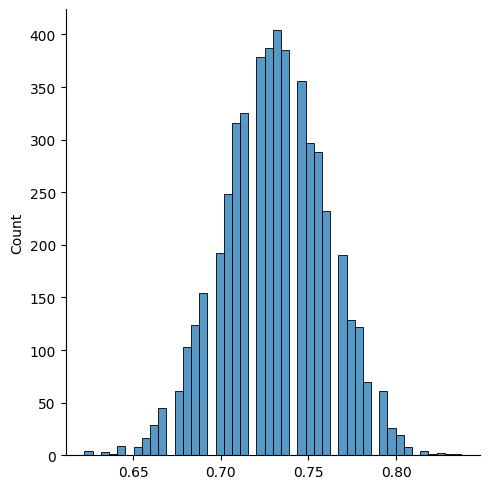

In [441]:
sb.displot(score)

In [443]:
from scipy.stats import shapiro, normaltest
t,p = shapiro(score)
if p > 0.05:
    print("Probablement normale")
else:
    print("Probablement pas normale")

Probablement pas normale


In [445]:
stat, p = normaltest(score)
print("D'Agostino's K^2 Test: Statistique=%.3f, p-valeur=%.3f" % (stat, p))

# Interprétation
if p > 0.05:
    print("Probablement normale")
else:
    print("Probablement pas normale")

D'Agostino's K^2 Test: Statistique=4.672, p-valeur=0.097
Probablement normale


In [458]:
import scipy.stats as stats
import seaborn as sb
import matplotlib.pyplot as mp


In [ ]:
stats.probplot(score,)